In [1]:
import os

os.environ["HF_HOME"] = "/dev/shm/hf-home"
os.environ["TRANSFORMERS_CACHE"] = "/dev/shm/hf-cache"
os.environ["HF_DATASETS_CACHE"] = "/dev/shm/hf-datasets"
os.environ["TORCH_HOME"] = "/dev/shm/torch-home"
os.environ["XDG_CACHE_HOME"] = "/dev/shm/.cache"
os.environ["WANDB_CACHE_DIR"] = "/dev/shm/wandb-cache"

In [2]:
# from datasets import load_dataset
# # Import environment variable
# import os
# #import dotenv
# import dotenv
# dotenv.load_dotenv()


# ds = load_dataset("TempoFunk/webvid-10M", token=os.getenv("HUGGINGFACE_TOKEN"), split="train", streaming=True)

# ds

In [3]:
# # Access one example
# example = next(iter(ds))
# example

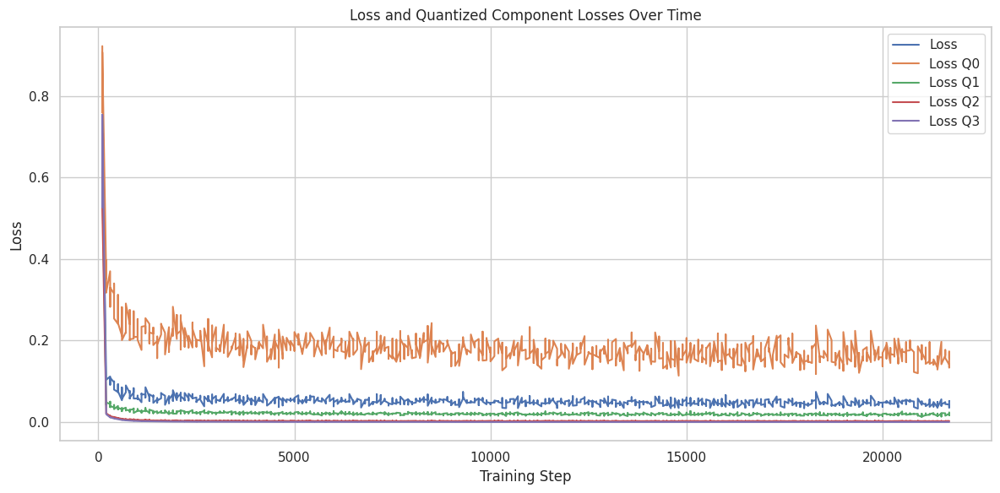

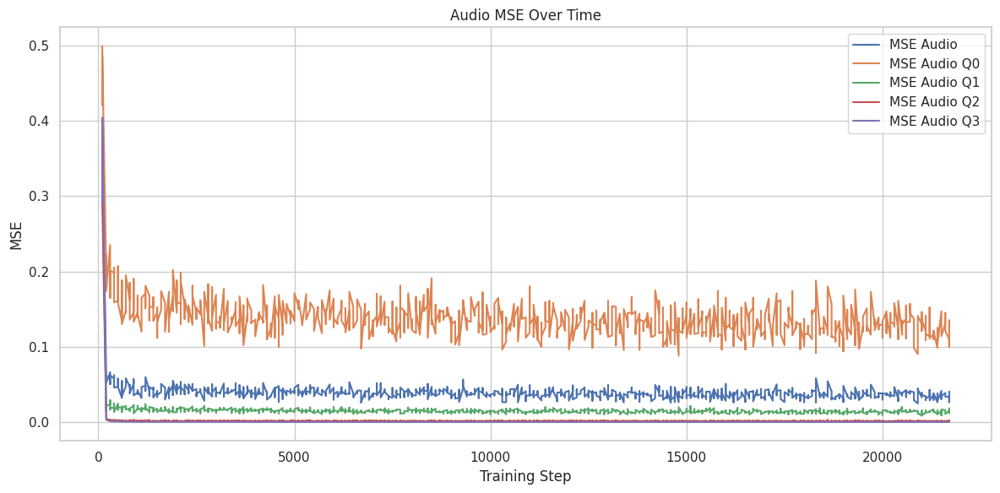

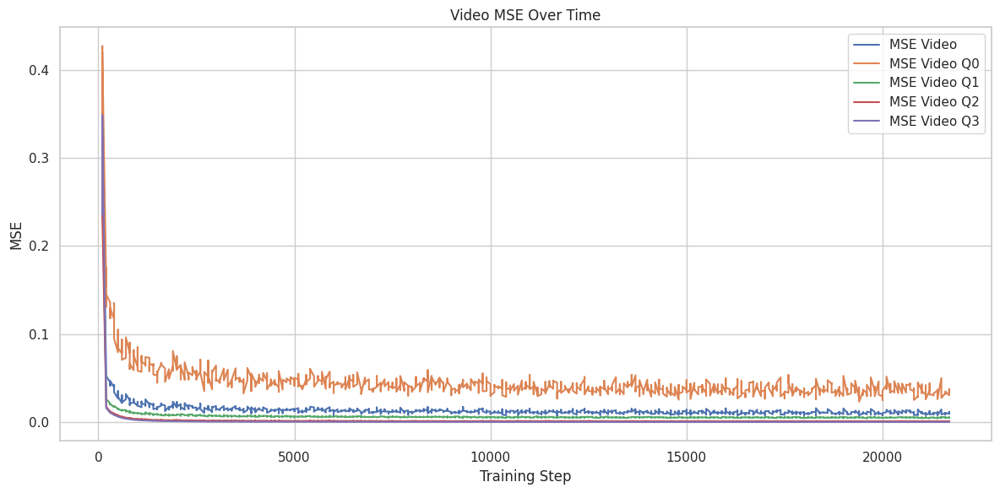

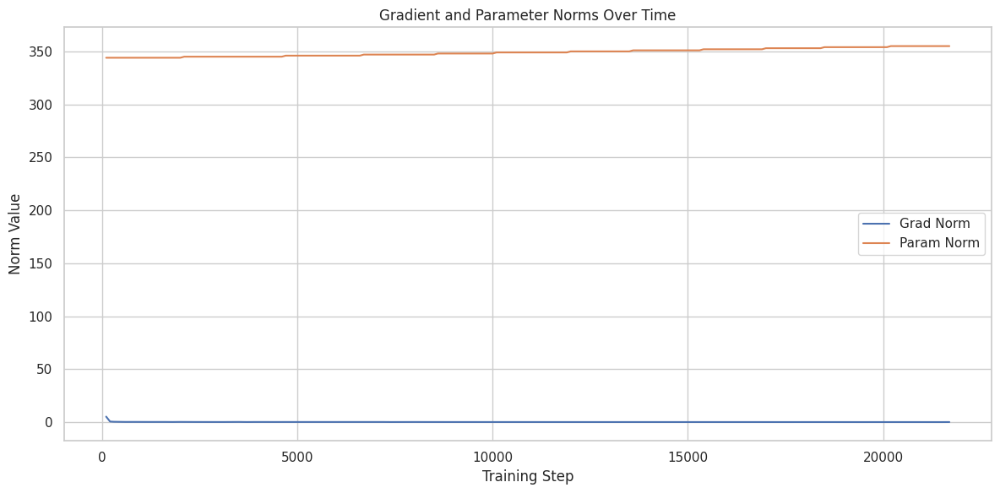

In [1]:
import re
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set plot style
sns.set(style="whitegrid")
LOG_FILE = "slurm_8915071.out"

# Regular expression for extracting timestamp and metrics
timestamp_re = re.compile(r"\|openai-(\d{4}-\d{2}-\d{2}-\d{2}:\d{2}:\d{2})\|")
metric_re = re.compile(r"\|\s*(\w+)\s*\|\s*([0-9.eE+-]+)\s*\|")

# Parsed data
data = []

with open(LOG_FILE, "r") as f:
    lines = f.readlines()

current_entry = {}
for line in lines:
    # New block start
    ts_match = timestamp_re.search(line)
    if ts_match:
        if current_entry:
            data.append(current_entry)
            current_entry = {}
        current_entry['timestamp'] = ts_match.group(1)
    else:
        m = metric_re.findall(line)
        for k, v in m:
            try:
                current_entry[k] = float(v)
            except ValueError:
                pass

# Add last block
if current_entry:
    data.append(current_entry)

# Convert to DataFrame
df = pd.DataFrame(data)
df['step'] = df['step'].astype(float)

# Sort by step or timestamp
df = df.sort_values('step')

# ========== Plotting ==========
def plot_metrics(df):
    plt.figure(figsize=(12, 6))
    plt.plot(df['step'], df['loss'], label='Loss')
    plt.plot(df['step'], df['loss_q0'], label='Loss Q0')
    plt.plot(df['step'], df['loss_q1'], label='Loss Q1')
    plt.plot(df['step'], df['loss_q2'], label='Loss Q2')
    plt.plot(df['step'], df['loss_q3'], label='Loss Q3')
    plt.title("Loss and Quantized Component Losses Over Time")
    plt.xlabel("Training Step")
    plt.ylabel("Loss")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Audio MSE
    plt.figure(figsize=(12, 6))
    plt.plot(df['step'], df['mse_audio'], label='MSE Audio')
    plt.plot(df['step'], df['mse_audio_q0'], label='MSE Audio Q0')
    plt.plot(df['step'], df['mse_audio_q1'], label='MSE Audio Q1')
    plt.plot(df['step'], df['mse_audio_q2'], label='MSE Audio Q2')
    plt.plot(df['step'], df['mse_audio_q3'], label='MSE Audio Q3')
    plt.title("Audio MSE Over Time")
    plt.xlabel("Training Step")
    plt.ylabel("MSE")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Video MSE
    plt.figure(figsize=(12, 6))
    plt.plot(df['step'], df['mse_video'], label='MSE Video')
    plt.plot(df['step'], df['mse_video_q0'], label='MSE Video Q0')
    plt.plot(df['step'], df['mse_video_q1'], label='MSE Video Q1')
    plt.plot(df['step'], df['mse_video_q2'], label='MSE Video Q2')
    plt.plot(df['step'], df['mse_video_q3'], label='MSE Video Q3')
    plt.title("Video MSE Over Time")
    plt.xlabel("Training Step")
    plt.ylabel("MSE")
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Grad & param norm
    plt.figure(figsize=(12, 6))
    plt.plot(df['step'], df['grad_norm'], label='Grad Norm')
    plt.plot(df['step'], df['param_norm'], label='Param Norm')
    plt.title("Gradient and Parameter Norms Over Time")
    plt.xlabel("Training Step")
    plt.ylabel("Norm Value")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_metrics(df)


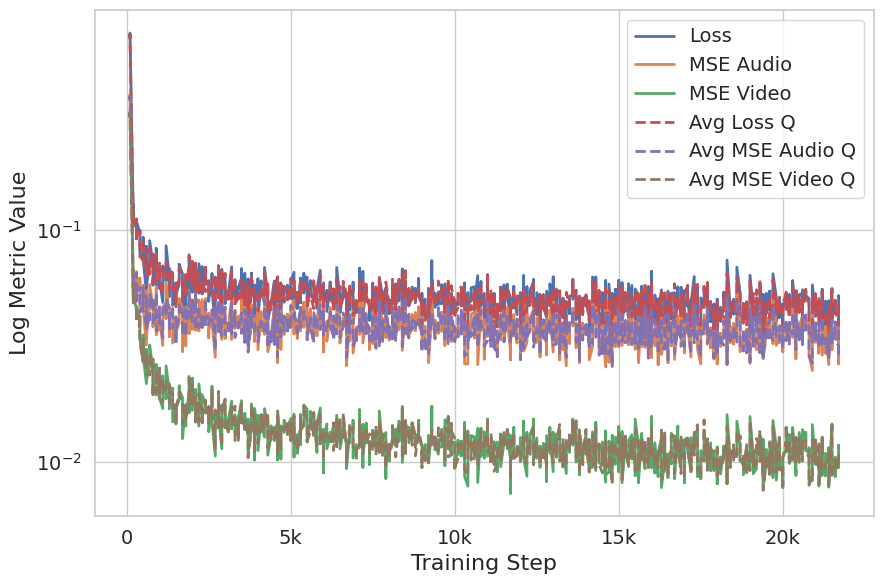

In [12]:
from matplotlib.ticker import FuncFormatter
import matplotlib.pyplot as plt

def plot_metrics(df):
    # Compute average Q values
    df['loss_q_avg'] = df[[f'loss_q{i}' for i in range(4)]].mean(axis=1)
    df['mse_audio_q_avg'] = df[[f'mse_audio_q{i}' for i in range(4)]].mean(axis=1)
    df['mse_video_q_avg'] = df[[f'mse_video_q{i}' for i in range(4)]].mean(axis=1)

    plt.figure(figsize=(9, 6))
    
    # Plot original metrics
    plt.plot(df['step'], df['loss'], label='Loss', linewidth=2)
    plt.plot(df['step'], df['mse_audio'], label='MSE Audio', linewidth=2)
    plt.plot(df['step'], df['mse_video'], label='MSE Video', linewidth=2)

    # Plot averaged Q metrics
    plt.plot(df['step'], df['loss_q_avg'], label='Avg Loss Q', linestyle='--', linewidth=2)
    plt.plot(df['step'], df['mse_audio_q_avg'], label='Avg MSE Audio Q', linestyle='--', linewidth=2)
    plt.plot(df['step'], df['mse_video_q_avg'], label='Avg MSE Video Q', linestyle='--', linewidth=2)

    # Larger labels and custom x-axis tick format
    plt.xlabel("Training Step", fontsize=16)
    plt.ylabel("Log Metric Value", fontsize=16)
    plt.xticks(fontsize=14)
    plt.yticks(fontsize=14)
    plt.yscale('log')
    plt.legend(fontsize=14)
    plt.grid(True)

    # Format x-axis ticks as '1k', '2k', etc.
    formatter = FuncFormatter(lambda x, _: f'{int(x/1000)}k' if x >= 1000 else int(x))
    plt.gca().xaxis.set_major_formatter(formatter)

    plt.tight_layout()
    plt.show()

plot_metrics(df)


/tmp/ipykernel_2334405/3175657689.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


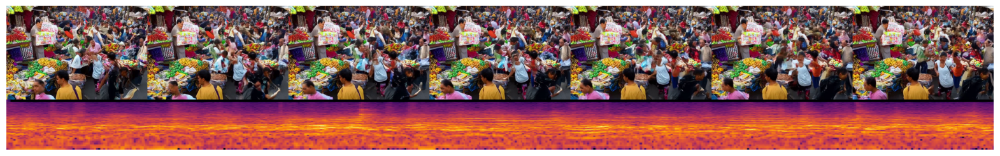

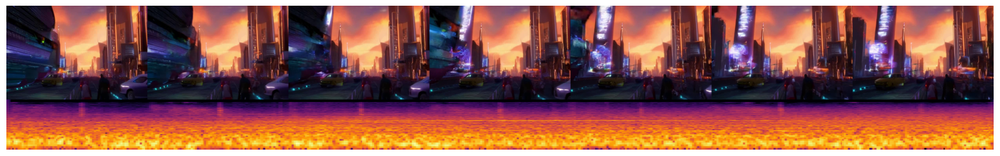

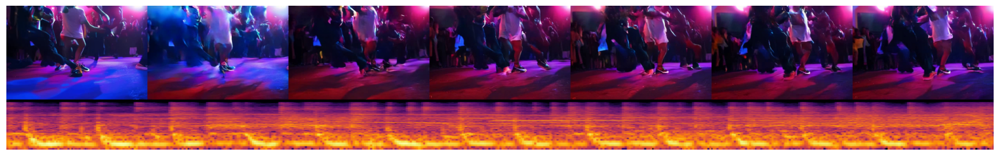

In [13]:
import cv2
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def extract_frames(video_path, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    frames = []

    for i in range(num_frames):
        ret, frame = cap.read()
        if not ret:
            break
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame_rgb)

    cap.release()
    return frames

def generate_spectrogram(audio_path, output_path="spectrogram_no_colorbar.png", fig_width=12, fig_height=5):
    y, sr = librosa.load(audio_path, sr=None)
    D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)

    plt.figure(figsize=(fig_width, fig_height))  # Larger width and height
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='inferno')
    plt.axis('off')
    plt.tight_layout()
    plt.savefig(output_path, bbox_inches='tight', pad_inches=0)
    plt.close()

    return np.array(Image.open(output_path).convert('RGB'))

def create_2x1_layout(frames, spectrogram, output_image, frame_height=200):
    frame_width = int(frames[0].shape[1] * frame_height / frames[0].shape[0])  # Maintain aspect ratio
    frames_resized = [cv2.resize(frame, (frame_width, frame_height)) for frame in frames]

    frames_stitched = np.hstack(frames_resized)

    spectrogram_resized = cv2.resize(spectrogram, (frames_stitched.shape[1], spectrogram.shape[0]))

    final_image = np.vstack((frames_stitched, spectrogram_resized))

    Image.fromarray(final_image).save(output_image)
    plt.figure(figsize=(20, 10))  # Show at big size
    plt.imshow(final_image)
    plt.axis('off')
    plt.show()

def main(video_path, audio_path, output_image="final_output.png"):
    frames = extract_frames(video_path, num_frames=7)
    spectrogram = generate_spectrogram(audio_path, fig_width=10, fig_height=11)
    create_2x1_layout(frames, spectrogram, output_image, frame_height=2000)

# Usage
video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_03.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_03.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)



# Usage
video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_01.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_01.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)




# Usage
video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_10.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_10.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

/tmp/ipykernel_2334405/3175657689.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


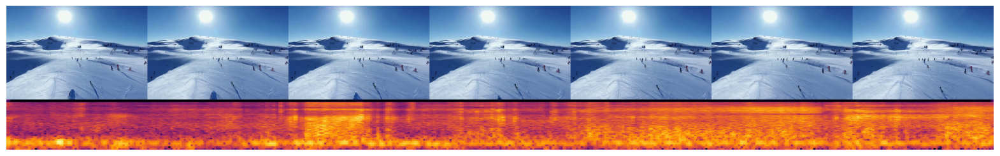

In [14]:

# Usage
video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_04.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_04.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

/tmp/ipykernel_2334405/3175657689.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


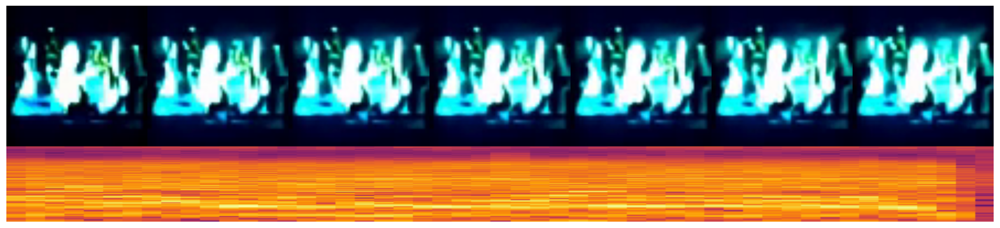

In [15]:
# Usage
video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_4/original/dpm_solver_samples_0_0_2.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_4/audios/dpm_solver_samples_0_0_2.wav"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

/tmp/ipykernel_2334405/3175657689.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


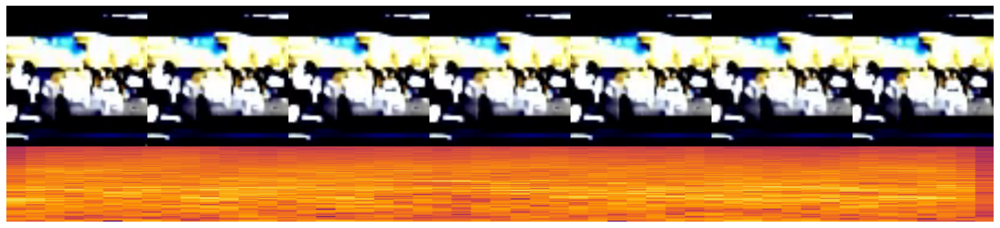

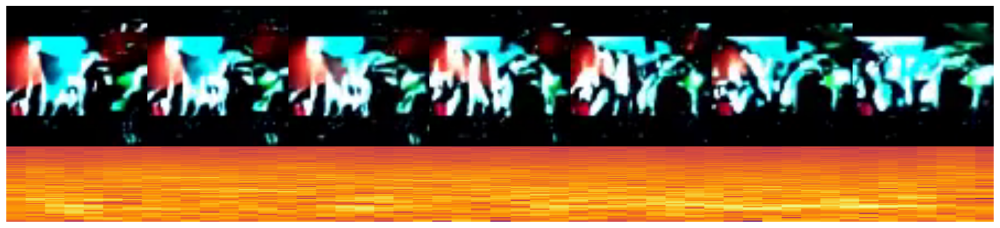

In [16]:
# Usage


video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_3/original/dpm_solver_samples_0_0_1.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_3/audios/dpm_solver_samples_0_0_1.wav"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/original/dpm_solver_samples_0_0_3.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/audios/dpm_solver_samples_0_0_3.wav"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)

/tmp/ipykernel_2334405/3175657689.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


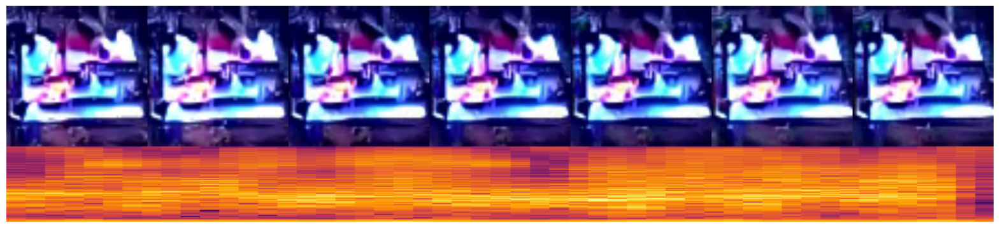

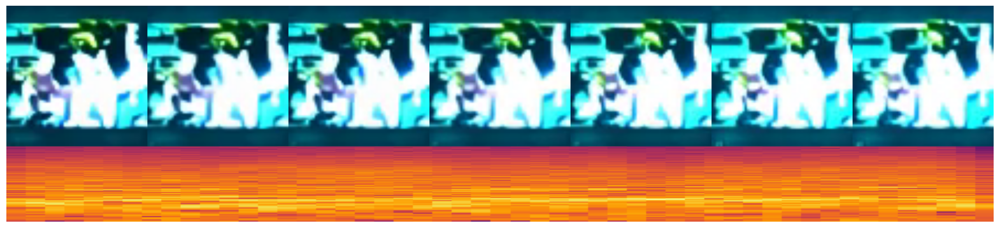

In [17]:


video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_3/original/dpm_solver_samples_0_0_0.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_3/audios/dpm_solver_samples_0_0_0.wav"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/original/dpm_solver_samples_0_0_0.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/audios/dpm_solver_samples_0_0_0.wav"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)

/tmp/ipykernel_2335919/2650234868.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


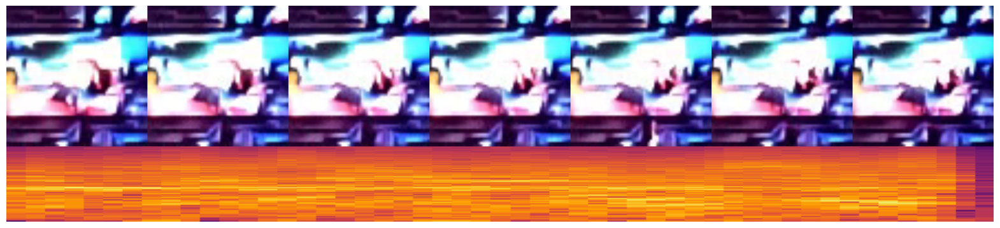

In [14]:
video_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/original/dpm_solver_samples_0_0_2.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/MM-Diffusion/data10/concerts_audiovideo_dataset/model020000/model020000_5/audios/dpm_solver_samples_0_0_2.wav"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)

/tmp/ipykernel_2335919/2650234868.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


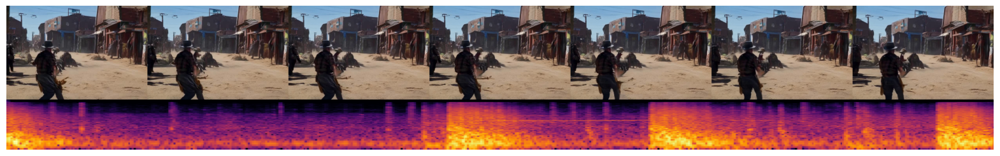

In [9]:

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_21.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_21.flac"
output_image = "text2image001.png"


# 
# model020000_5/audios/dpm_solver_samples_0_0_3

main(video_path, audio_path, output_image)

/tmp/ipykernel_2335919/2650234868.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


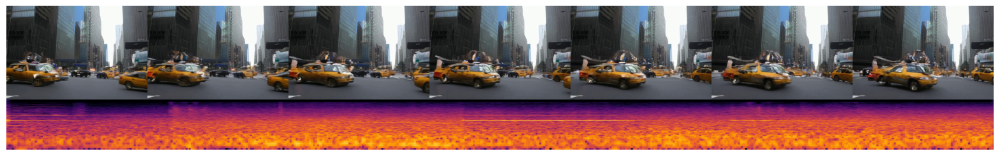

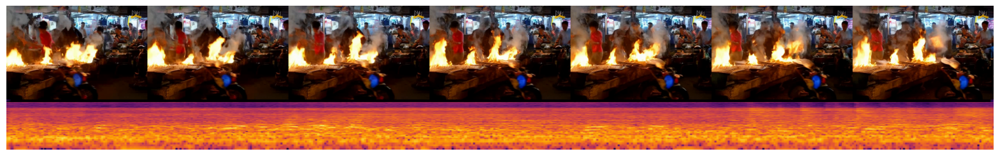

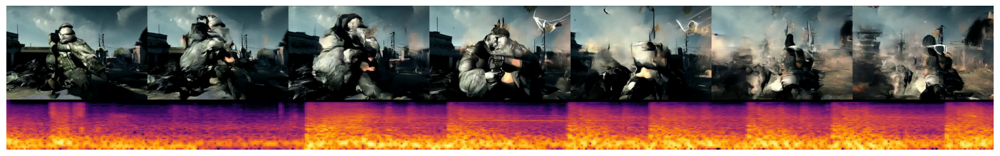

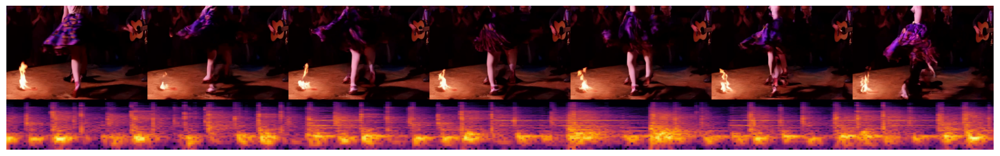

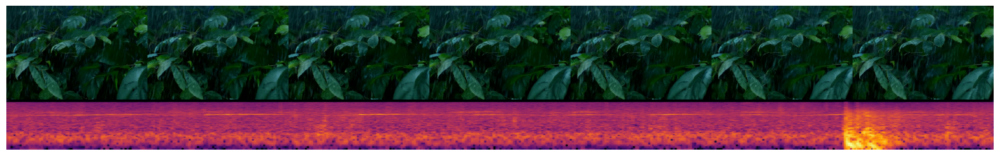

...

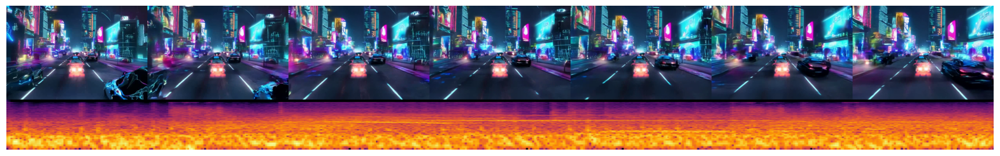

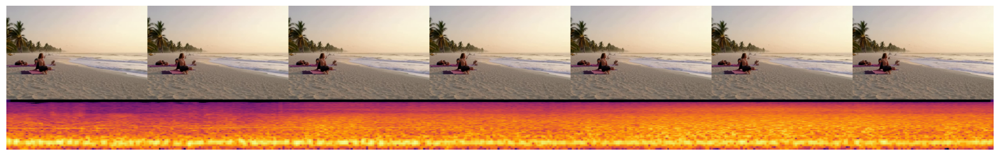

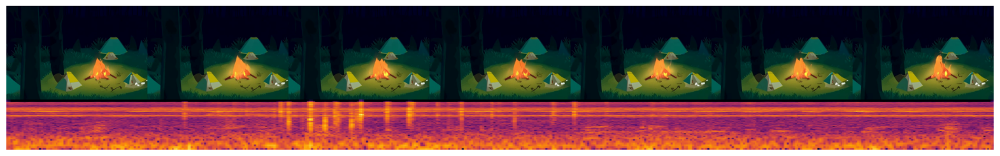

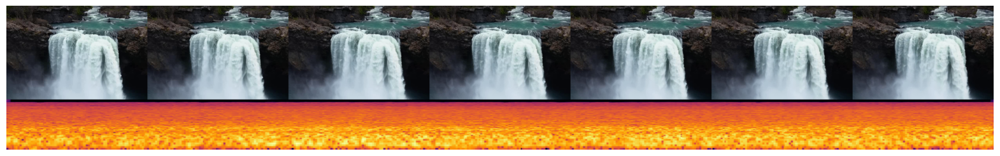

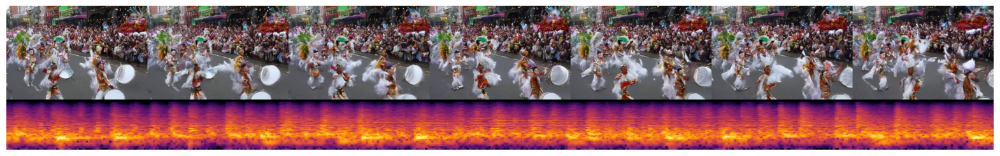

In [16]:
video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_01.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_01.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_02.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_02.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_04.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_04.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_05.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_05.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_06.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_06.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_07.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_07.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_09.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_09.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)


video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_10.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_10.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_11.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_11.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_13.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_13.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_12.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_12.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)



video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_15.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output_v1/video_15.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

/tmp/ipykernel_2335919/2650234868.py:24: UserWarning: amplitude_to_db was called on complex input so phase information will be discarded. To suppress this warning, call amplitude_to_db(np.abs(S)) instead.
  D = librosa.amplitude_to_db(librosa.stft(y), ref=np.max)


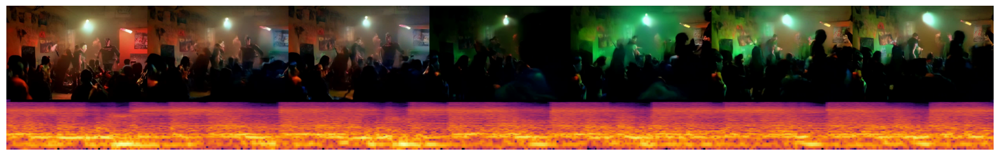

In [17]:

video_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_10.mp4"
audio_path = "/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/video_10.flac"
output_image = "text2image001.png"

main(video_path, audio_path, output_image)

# Main metrics

In [4]:
import torch
import os
import numpy as np
from scipy.linalg import sqrtm
from pathlib import Path
from tqdm import tqdm
import torchaudio
import torchvision
from torchvision import transforms
import torch.nn.functional as F
import subprocess
import shutil

# --- Directory paths ---
# --- Directory paths ---
GEN_DIR = Path("./data10/concerts_audiovideo_dataset/generated")
REAL_DIR = Path("./data10/concerts_audiovideo_dataset/unittest")
# --- GPU Setup ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def extract_audio_from_video(video_path, output_path):
    """Extracts audio from video using ffmpeg."""
    cmd = [
        "ffmpeg",
        "-i", str(video_path),
        "-q:a", "0",
        "-map", "a",
        str(output_path),
        "-y"
    ]
    subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

# ----- FIXED: Audio Feature Extraction using librosa/torchaudio -----
def extract_audio_embeddings(audio_path):
    """Extract audio embeddings directly from audio file using librosa and a simple feature extractor."""
    try:
        # Load audio file
        import librosa
        y, sr = librosa.load(audio_path, sr=22050, mono=True)
        
        # Extract mel spectrogram features
        mel_spec = librosa.feature.melspectrogram(
            y=y, 
            sr=sr, 
            n_fft=2048, 
            hop_length=512, 
            n_mels=128
        )
        
        # Convert to dB scale
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        
        # Extract MFCC features
        mfcc = librosa.feature.mfcc(S=librosa.power_to_db(mel_spec), n_mfcc=20)
        
        # Extract chroma features
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        
        # Extract spectral contrast
        contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        
        # Create a feature vector by taking statistics over time
        features = []
        
        # Mean and std of MFCC
        features.extend(np.mean(mfcc, axis=1))
        features.extend(np.std(mfcc, axis=1))
        
        # Mean and std of chroma
        features.extend(np.mean(chroma, axis=1))
        features.extend(np.std(chroma, axis=1))
        
        # Mean and std of contrast
        features.extend(np.mean(contrast, axis=1))
        features.extend(np.std(contrast, axis=1))
        
        # Basic stats of the mel spectrogram
        features.extend([
            np.mean(mel_spec_db),
            np.std(mel_spec_db),
            np.median(mel_spec_db),
            np.max(mel_spec_db),
            np.min(mel_spec_db)
        ])
        
        # Convert to numpy array
        feature_vector = np.array(features, dtype=np.float32)
        
        return feature_vector
    except ImportError:
        print("Librosa not properly installed. Installing now...")
        import sys
        subprocess.check_call([sys.executable, "-m", "pip", "install", "librosa"])
        return extract_audio_embeddings(audio_path)
    except Exception as e:
        print(f"Error extracting audio features: {e}")
        # Return a zero vector as fallback
        return np.zeros(128, dtype=np.float32)

def extract_audio_features_fallback(audio_path):
    """Fallback audio feature extraction using torchaudio and a pretrained model."""
    # Load audio
    waveform, sample_rate = torchaudio.load(audio_path)
    
    # Resample if necessary (most models expect 16kHz)
    if sample_rate != 16000:
        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
        waveform = resampler(waveform)
    
    # Convert to mono if necessary
    if waveform.shape[0] > 1:
        waveform = torch.mean(waveform, dim=0, keepdim=True)
    
    # Use torchaudio's built-in feature extractor (MelSpectrogram)
    mel_spectrogram = torchaudio.transforms.MelSpectrogram(
        sample_rate=16000,
        n_fft=1024,
        hop_length=512,
        n_mels=64
    )(waveform)
    
    # Convert to dB scale
    mel_spectrogram = torchaudio.transforms.AmplitudeToDB()(mel_spectrogram)
    
    # Use a pretrained ResNet as a feature extractor
    model = torchvision.models.resnet18(pretrained=True)
    # Remove the final classification layer
    feature_extractor = torch.nn.Sequential(*list(model.children())[:-1])
    feature_extractor.eval()
    feature_extractor = feature_extractor.to(device)
    
    # Prepare input for the model (convert 1D spectrogram to 2D image-like tensor)
    # Stack the same spectrogram three times to match RGB input channels
    input_tensor = mel_spectrogram.repeat(3, 1, 1)
    
    # Resize to match the expected input size of ResNet
    input_tensor = F.interpolate(input_tensor.unsqueeze(0), size=(224, 224), mode='bilinear', align_corners=False)
    input_tensor = input_tensor.to(device)
    
    # Extract features
    with torch.no_grad():
        features = feature_extractor(input_tensor)
    
    # Return flattened features
    return features.squeeze().cpu().numpy()

# --- Video Feature Extraction (I3D or 3D ResNet) ---
def extract_i3d_features(video_path):
    """Extract I3D features from the video file."""
    # Load and preprocess the video
    video_frames = extract_video_frames(video_path)
    
    if not video_frames:
        print(f"Warning: No frames extracted from {video_path}")
        return np.zeros((1, 512))  # Return a zero vector if no frames
    
    # Stack frames into a tensor
    video_tensor = preprocess_frames(video_frames)
    video_tensor = video_tensor.to(device)
    
    # Load pretrained model
    model = torchvision.models.video.r3d_18(pretrained=True).to(device)
    # Remove classification layer to get features
    feature_extractor = torch.nn.Sequential(*list(model.children())[:-1])
    feature_extractor.eval()
    
    # Forward pass through model
    with torch.no_grad():
        features = feature_extractor(video_tensor)
    
    return features.squeeze().cpu().numpy()

def extract_video_frames(video_path):
    """Extract frames from video using OpenCV and preprocess."""
    try:
        import cv2
        cap = cv2.VideoCapture(str(video_path))
        frames = []
        
        if not cap.isOpened():
            print(f"Error: Could not open video {video_path}")
            return []
        
        max_frames = 32  # Limit to a reasonable number of frames
        frame_count = 0
        
        while frame_count < max_frames:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Convert from BGR to RGB
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
            frame_count += 1
            
        cap.release()
        
        # If video is too short, duplicate frames
        if frames and len(frames) < 16:
            frames = frames * (16 // len(frames) + 1)
            frames = frames[:16]  # Truncate to exactly 16 frames
            
        return frames
    except Exception as e:
        print(f"Error extracting frames from {video_path}: {e}")
        return []

def preprocess_frames(frames):
    """Preprocess video frames for the 3D model."""
    if not frames:
        return torch.zeros((1, 3, 16, 112, 112))
    
    # Create transforms
    video_transform = transforms.Compose([
        transforms.Lambda(lambda x: torch.tensor(x).permute(2, 0, 1).float() / 255.0),  # to [C,H,W] and normalize
        transforms.Resize((112, 112)),
    ])
    
    # Apply transforms to each frame
    processed_frames = []
    for frame in frames:
        processed_frames.append(video_transform(frame))
    
    # If we have too many frames, sample uniformly
    if len(processed_frames) > 16:
        indices = np.linspace(0, len(processed_frames)-1, 16, dtype=int)
        processed_frames = [processed_frames[i] for i in indices]
    
    # Stack into tensor [C, T, H, W]
    video_tensor = torch.stack(processed_frames, dim=1)
    
    # Add batch dimension [B, C, T, H, W]
    video_tensor = video_tensor.unsqueeze(0)
    
    return video_tensor

# --- Helper Functions to Compute Metrics ---
def compute_stats(features):
    """Compute mean and covariance of feature set."""
    mu = np.mean(features, axis=0)
    sigma = np.cov(features, rowvar=False)
    return mu, sigma

def compute_frechet_distance(mu1, sigma1, mu2, sigma2):
    """Compute Fréchet Distance between two distributions."""
    # Handle potential numerical issues
    try:
        # Add small regularization to avoid numerical issues
        sigma1 = sigma1 + np.eye(sigma1.shape[0]) * 1e-6
        sigma2 = sigma2 + np.eye(sigma2.shape[0]) * 1e-6
        
        # Calculate sqrt(sigma1 @ sigma2)
        covmean, _ = sqrtm(sigma1 @ sigma2, disp=False)
        
        if np.iscomplexobj(covmean):
            covmean = covmean.real
            
        diff = mu1 - mu2
        fd = diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean)
        
        # Ensure non-negative result
        return max(0.0, fd)
    except Exception as e:
        print(f"Error in Frechet distance calculation: {e}")
        return float('inf')  # Return infinity on error

def compute_kernel_video_distance(real_features, gen_features, sigma=1.0):
    """
    Compute Kernel Video Distance (KVD) as described in the literature.
    
    KVD uses Maximum Mean Discrepancy (MMD) with RBF kernel to compare 
    the distribution of real and generated video features.
    
    Args:
        real_features: NumPy array of real video features (n_samples × feature_dim)
        gen_features: NumPy array of generated video features (n_samples × feature_dim)
        sigma: RBF kernel bandwidth parameter
        
    Returns:
        KVD score (lower is better)
    """
    # Make sure inputs are numpy arrays
    real_features = np.asarray(real_features)
    gen_features = np.asarray(gen_features)
    
    # Get dimensions
    n_real = real_features.shape[0]
    n_gen = gen_features.shape[0]
    
    # Compute RBF kernel values
    def rbf_kernel(X, Y, sigma=1.0):
        """RBF kernel function"""
        X_sqnorms = np.sum(X**2, axis=1, keepdims=True)
        Y_sqnorms = np.sum(Y**2, axis=1, keepdims=True)
        gamma = 1 / (2 * sigma**2)
        K_XY = np.exp(-gamma * (X_sqnorms - 2 * np.dot(X, Y.T) + Y_sqnorms.T))
        return K_XY
    
    # Compute kernel matrices
    K_XX = rbf_kernel(real_features, real_features, sigma)
    K_YY = rbf_kernel(gen_features, gen_features, sigma)
    K_XY = rbf_kernel(real_features, gen_features, sigma)
    
    # Compute MMD^2
    mmd2 = (np.sum(K_XX) - np.sum(np.diag(K_XX))) / (n_real * (n_real - 1))
    mmd2 += (np.sum(K_YY) - np.sum(np.diag(K_YY))) / (n_gen * (n_gen - 1))
    mmd2 -= 2 * np.sum(K_XY) / (n_real * n_gen)
    
    # Return KVD = sqrt(MMD^2)
    return np.sqrt(max(0, mmd2))

# --- Metric Calculation ---
def collect_files(base_dir, extensions):
    """Collect files from directory based on extensions."""
    files = []
    for ext in extensions:
        files.extend(list(base_dir.glob(f"**/*{ext}")))
    return sorted(files)

def compute_fad(generated_audio, real_audio):
    """Compute Fréchet Audio Distance (FAD)."""
    print("Extracting features from generated audio...")
    gen_features = []
    for f in tqdm(generated_audio):
        try:
            features = extract_audio_embeddings(str(f))
            if features is not None and features.size > 0:
                gen_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing generated audio {f}: {e}")
    
    print("Extracting features from real audio...")
    real_features = []
    for f in tqdm(real_audio):
        try:
            features = extract_audio_embeddings(str(f))
            if features is not None and features.size > 0:
                real_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing real audio {f}: {e}")
    
    if not gen_features or not real_features:
        print("Error: No valid audio features extracted")
        return float('inf')
    
    # Make sure all feature vectors have the same dimension
    min_dim = min(gen_features[0].shape[0], real_features[0].shape[0])
    gen_features = [f[:min_dim] for f in gen_features]
    real_features = [f[:min_dim] for f in real_features]
    
    # Stack features
    gen_features_array = np.vstack(gen_features)
    real_features_array = np.vstack(real_features)
    
    # Compute statistics
    mu_gen, sigma_gen = compute_stats(gen_features_array)
    mu_real, sigma_real = compute_stats(real_features_array)
    
    # Calculate FAD
    return compute_frechet_distance(mu_gen, sigma_gen, mu_real, sigma_real)

def compute_fvd_kvd(generated_videos, real_videos):
    """Compute Fréchet Video Distance (FVD) and Kernel Video Distance (KVD)."""
    print("Extracting features from generated videos...")
    gen_features = []
    for f in tqdm(generated_videos):
        try:
            features = extract_i3d_features(str(f))
            if features is not None and features.size > 0:
                gen_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing generated video {f}: {e}")
    
    print("Extracting features from real videos...")
    real_features = []
    for f in tqdm(real_videos):
        try:
            features = extract_i3d_features(str(f))
            if features is not None and features.size > 0:
                real_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing real video {f}: {e}")
    
    if not gen_features or not real_features:
        print("Error: No valid video features extracted")
        return float('inf'), float('inf')
    
    # Make sure all feature vectors have the same dimension
    min_dim = min(gen_features[0].shape[0], real_features[0].shape[0])
    gen_features = [f[:min_dim] for f in gen_features]
    real_features = [f[:min_dim] for f in real_features]
    
    # Stack features
    gen_features_array = np.vstack(gen_features)
    real_features_array = np.vstack(real_features)
    
    # Compute statistics for FVD
    mu_gen, sigma_gen = compute_stats(gen_features_array)
    mu_real, sigma_real = compute_stats(real_features_array)
    
    # Calculate FVD
    fvd = compute_frechet_distance(mu_gen, sigma_gen, mu_real, sigma_real)
    
    # Calculate KVD using kernel method (MMD-based)
    kvd = compute_kernel_video_distance(real_features_array, gen_features_array)
    
    return fvd, kvd

def evaluate_mp4_dataset(gen_dir, real_dir, sample_limit=None):
    """
    Comprehensive evaluation function for MP4 datasets containing both video and audio
    
    Args:
        gen_dir: Path to directory containing generated MP4 files
        real_dir: Path to directory containing real MP4 files
        sample_limit: Optional limit on number of files to process (for testing)
    
    Returns:
        Dictionary with evaluation metrics
    """
    print("Starting comprehensive MP4 evaluation...")
    
    # Check if directories exist
    if not gen_dir.exists():
        print(f"Warning: Generated directory {gen_dir} does not exist")
        return None
    if not real_dir.exists():
        print(f"Warning: Real directory {real_dir} does not exist")
        return None
    
    # Collect MP4 files
    generated_videos = collect_files(gen_dir, [".mp4"])
    real_videos = collect_files(real_dir, [".mp4"])
    
    # Apply sample limit if specified
    if sample_limit:
        if len(generated_videos) > sample_limit:
            generated_videos = generated_videos[:sample_limit]
        if len(real_videos) > sample_limit:
            real_videos = real_videos[:sample_limit]
    
    print(f"Found {len(generated_videos)} generated videos and {len(real_videos)} real videos")
    
    if not generated_videos or not real_videos:
        print("Error: No video files found. Please check your paths.")
        return None
    
    # Create temporary directory for extracted audio
    temp_audio_dir = Path("./temp_audio")
    temp_audio_dir.mkdir(exist_ok=True)
    
    results = {}
    
    # --- Audio Evaluation Pipeline ---
    print("\n=== AUDIO EVALUATION ===")
    generated_audio = []
    real_audio = []
    
    print("Extracting audio from videos...")
    # Process generated videos
    for v in tqdm(generated_videos):
        try:
            out_audio = temp_audio_dir / f"{v.stem}_gen.wav"
            extract_audio_from_video(v, out_audio)
            if out_audio.exists():
                generated_audio.append(out_audio)
        except Exception as e:
            print(f"Error extracting audio from {v}: {e}")
    
    # Process real videos
    for v in tqdm(real_videos):
        try:
            out_audio = temp_audio_dir / f"{v.stem}_real.wav"
            extract_audio_from_video(v, out_audio)
            if out_audio.exists():
                real_audio.append(out_audio)
        except Exception as e:
            print(f"Error extracting audio from {v}: {e}")
    
    print(f"Extracted {len(generated_audio)} generated audio files and {len(real_audio)} real audio files")
    
    # Compute FAD if we have audio files
    if generated_audio and real_audio:
        print("Computing FAD...")
        fad = compute_fad(generated_audio, real_audio)
        print(f"FAD ↓: {fad:.4f}")
        results['FAD'] = fad
    else:
        print("Skipping FAD calculation due to missing audio files")
    
    # --- Video Evaluation Pipeline ---
    print("\n=== VIDEO EVALUATION ===")
    if generated_videos and real_videos:
        print("Computing FVD and KVD...")
        fvd, kvd = compute_fvd_kvd(generated_videos, real_videos)
        print(f"FVD ↓: {fvd:.4f}")
        print(f"KVD ↓: {kvd:.4f}")
        results['FVD'] = fvd
        results['KVD'] = kvd
    else:
        print("Skipping FVD and KVD calculation due to missing video files")
    
    # Cleanup
    print("\nCleaning up temporary files...")
    try:
        shutil.rmtree(temp_audio_dir)
    except Exception as e:
        print(f"Error during cleanup: {e}")
    
    print("Evaluation complete!")
    return results

def main():
    """Main function for running the evaluation"""
    print("Starting evaluation pipeline...")
    
    # Define sample limit for testing (set to None to process all files)
    sample_limit = None  # Example: 5 for processing only 5 files
    
    # Run the evaluation
    results = evaluate_mp4_dataset(
        gen_dir=GEN_DIR,
        real_dir=REAL_DIR,
        sample_limit=sample_limit
    )
    
    if results:
        print("\n=== SUMMARY OF RESULTS ===")
        for metric, value in results.items():
            print(f"{metric}: {value:.4f}")
    else:
        print("Evaluation failed to produce results")

if __name__ == "__main__":
    main()

Using device: cuda
Starting evaluation pipeline...
Starting comprehensive MP4 evaluation...
Found 20 generated videos and 20 real videos

=== AUDIO EVALUATION ===
Extracting audio from videos...


 10%|█         | 2/20 [00:00<00:01, 16.04it/s]

100%|██████████| 20/20 [00:03<00:00,  5.59it/s]


Extracted 20 generated audio files and 20 real audio files
Computing FAD...
Extracting features from generated audio...


100%|██████████| 20/20 [00:00<00:00, 46.85it/s]


Extracting features from real audio...


100%|██████████| 20/20 [00:05<00:00,  3.91it/s]


FAD ↓: 61460.9440

=== VIDEO EVALUATION ===
Computing FVD and KVD...
Extracting features from generated videos...


  0%|          | 0/20 [00:00<?, ?it/s]/home/users/ap794/final_project_distillLLM/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/users/ap794/final_project_distillLLM/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=R3D_18_Weights.KINETICS400_V1`. You can also use `weights=R3D_18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 20/20 [00:10<00:00,  1.84it/s]


Extracting features from real videos...


100%|██████████| 20/20 [00:16<00:00,  1.19it/s]


FVD ↓: 251.6190
KVD ↓: 0.0000

Cleaning up temporary files...
Evaluation complete!

=== SUMMARY OF RESULTS ===
FAD: 61460.9440
FVD: 251.6190
KVD: 0.0000


In [10]:
import torch
import os
import numpy as np
from scipy.linalg import sqrtm
from pathlib import Path
from tqdm import tqdm
import torchaudio
import torchvision
from torchvision import transforms
import torch.nn.functional as F
import subprocess
import shutil

# --- Directory paths ---
# --- Directory paths ---
GEN_DIR = Path("/home/users/ap794/finalCS590-text2audiovideo/text2Movie/src/output/")
REAL_DIR = Path("./data10/concerts_audiovideo_dataset/unittest")
# --- GPU Setup ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

def extract_audio_from_video(video_path, output_path):
    """Extracts audio from video using ffmpeg."""
    cmd = [
        "ffmpeg",
        "-i", str(video_path),
        "-q:a", "0",
        "-map", "a",
        str(output_path),
        "-y"
    ]
    subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL)

# ----- FIXED: Audio Feature Extraction using librosa/torchaudio -----
def extract_audio_embeddings(audio_path):
    """Extract audio embeddings directly from audio file using librosa and a simple feature extractor."""
    try:
        # Load audio file
        import librosa
        y, sr = librosa.load(audio_path, sr=22050, mono=True)
        
        # Extract mel spectrogram features
        mel_spec = librosa.feature.melspectrogram(
            y=y, 
            sr=sr, 
            n_fft=2048, 
            hop_length=512, 
            n_mels=128
        )
        
        # Convert to dB scale
        mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)
        
        # Extract MFCC features
        mfcc = librosa.feature.mfcc(S=librosa.power_to_db(mel_spec), n_mfcc=20)
        
        # Extract chroma features
        chroma = librosa.feature.chroma_stft(y=y, sr=sr)
        
        # Extract spectral contrast
        contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        
        # Create a feature vector by taking statistics over time
        features = []
        
        # Mean and std of MFCC
        features.extend(np.mean(mfcc, axis=1))
        features.extend(np.std(mfcc, axis=1))
        
        # Mean and std of chroma
        features.extend(np.mean(chroma, axis=1))
        features.extend(np.std(chroma, axis=1))
        
        # Mean and std of contrast
        features.extend(np.mean(contrast, axis=1))
        features.extend(np.std(contrast, axis=1))
        
        # Basic stats of the mel spectrogram
        features.extend([
            np.mean(mel_spec_db),
            np.std(mel_spec_db),
            np.median(mel_spec_db),
            np.max(mel_spec_db),
            np.min(mel_spec_db)
        ])
        
        # Convert to numpy array
        feature_vector = np.array(features, dtype=np.float32)
        
        return feature_vector
    except ImportError:
        print("Librosa not properly installed. Installing now...")
        import sys
        subprocess.check_call([sys.executable, "-m", "pip", "install", "librosa"])
        return extract_audio_embeddings(audio_path)
    except Exception as e:
        print(f"Error extracting audio features: {e}")
        # Return a zero vector as fallback
        return np.zeros(128, dtype=np.float32)

def extract_audio_features_fallback(audio_path):
    """Fallback audio feature extraction using torchaudio and a pretrained model."""
    # Load audio
    waveform, sample_rate = torchaudio.load(audio_path)
    
    # Resample if necessary (most models expect 16kHz)
    if sample_rate != 16000:
        resampler = torchaudio.transforms.Resample(orig_freq=sample_rate, new_freq=16000)
        waveform = resampler(waveform)
    
    # Convert to mono if necessary
    if waveform.shape[0] > 1:
        waveform = torch.mean(waveform, dim=0, keepdim=True)
    
    # Use torchaudio's built-in feature extractor (MelSpectrogram)
    mel_spectrogram = torchaudio.transforms.MelSpectrogram(
        sample_rate=16000,
        n_fft=1024,
        hop_length=512,
        n_mels=64
    )(waveform)
    
    # Convert to dB scale
    mel_spectrogram = torchaudio.transforms.AmplitudeToDB()(mel_spectrogram)
    
    # Use a pretrained ResNet as a feature extractor
    model = torchvision.models.resnet18(pretrained=True)
    # Remove the final classification layer
    feature_extractor = torch.nn.Sequential(*list(model.children())[:-1])
    feature_extractor.eval()
    feature_extractor = feature_extractor.to(device)
    
    # Prepare input for the model (convert 1D spectrogram to 2D image-like tensor)
    # Stack the same spectrogram three times to match RGB input channels
    input_tensor = mel_spectrogram.repeat(3, 1, 1)
    
    # Resize to match the expected input size of ResNet
    input_tensor = F.interpolate(input_tensor.unsqueeze(0), size=(224, 224), mode='bilinear', align_corners=False)
    input_tensor = input_tensor.to(device)
    
    # Extract features
    with torch.no_grad():
        features = feature_extractor(input_tensor)
    
    # Return flattened features
    return features.squeeze().cpu().numpy()

# --- Video Feature Extraction (I3D or 3D ResNet) ---
def extract_i3d_features(video_path):
    """Extract I3D features from the video file."""
    # Load and preprocess the video
    video_frames = extract_video_frames(video_path)
    
    if not video_frames:
        print(f"Warning: No frames extracted from {video_path}")
        return np.zeros((1, 512))  # Return a zero vector if no frames
    
    # Stack frames into a tensor
    video_tensor = preprocess_frames(video_frames)
    video_tensor = video_tensor.to(device)
    
    # Load pretrained model
    model = torchvision.models.video.r3d_18(pretrained=True).to(device)
    # Remove classification layer to get features
    feature_extractor = torch.nn.Sequential(*list(model.children())[:-1])
    feature_extractor.eval()
    
    # Forward pass through model
    with torch.no_grad():
        features = feature_extractor(video_tensor)
    
    return features.squeeze().cpu().numpy()

def extract_video_frames(video_path):
    """Extract frames from video using OpenCV and preprocess."""
    try:
        import cv2
        cap = cv2.VideoCapture(str(video_path))
        frames = []
        
        if not cap.isOpened():
            print(f"Error: Could not open video {video_path}")
            return []
        
        max_frames = 32  # Limit to a reasonable number of frames
        frame_count = 0
        
        while frame_count < max_frames:
            ret, frame = cap.read()
            if not ret:
                break
            
            # Convert from BGR to RGB
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
            frames.append(frame)
            frame_count += 1
            
        cap.release()
        
        # If video is too short, duplicate frames
        if frames and len(frames) < 16:
            frames = frames * (16 // len(frames) + 1)
            frames = frames[:16]  # Truncate to exactly 16 frames
            
        return frames
    except Exception as e:
        print(f"Error extracting frames from {video_path}: {e}")
        return []

def preprocess_frames(frames):
    """Preprocess video frames for the 3D model."""
    if not frames:
        return torch.zeros((1, 3, 16, 112, 112))
    
    # Create transforms
    video_transform = transforms.Compose([
        transforms.Lambda(lambda x: torch.tensor(x).permute(2, 0, 1).float() / 255.0),  # to [C,H,W] and normalize
        transforms.Resize((112, 112)),
    ])
    
    # Apply transforms to each frame
    processed_frames = []
    for frame in frames:
        processed_frames.append(video_transform(frame))
    
    # If we have too many frames, sample uniformly
    if len(processed_frames) > 16:
        indices = np.linspace(0, len(processed_frames)-1, 16, dtype=int)
        processed_frames = [processed_frames[i] for i in indices]
    
    # Stack into tensor [C, T, H, W]
    video_tensor = torch.stack(processed_frames, dim=1)
    
    # Add batch dimension [B, C, T, H, W]
    video_tensor = video_tensor.unsqueeze(0)
    
    return video_tensor

# --- Helper Functions to Compute Metrics ---
def compute_stats(features):
    """Compute mean and covariance of feature set."""
    mu = np.mean(features, axis=0)
    sigma = np.cov(features, rowvar=False)
    return mu, sigma

def compute_frechet_distance(mu1, sigma1, mu2, sigma2):
    """Compute Fréchet Distance between two distributions."""
    # Handle potential numerical issues
    try:
        # Add small regularization to avoid numerical issues
        sigma1 = sigma1 + np.eye(sigma1.shape[0]) * 1e-6
        sigma2 = sigma2 + np.eye(sigma2.shape[0]) * 1e-6
        
        # Calculate sqrt(sigma1 @ sigma2)
        covmean, _ = sqrtm(sigma1 @ sigma2, disp=False)
        
        if np.iscomplexobj(covmean):
            covmean = covmean.real
            
        diff = mu1 - mu2
        fd = diff @ diff + np.trace(sigma1 + sigma2 - 2 * covmean)
        
        # Ensure non-negative result
        return max(0.0, fd)
    except Exception as e:
        print(f"Error in Frechet distance calculation: {e}")
        return float('inf')  # Return infinity on error

def compute_kernel_video_distance(real_features, gen_features, sigma=1.0):
    """
    Compute Kernel Video Distance (KVD) as described in the literature.
    
    KVD uses Maximum Mean Discrepancy (MMD) with RBF kernel to compare 
    the distribution of real and generated video features.
    
    Args:
        real_features: NumPy array of real video features (n_samples × feature_dim)
        gen_features: NumPy array of generated video features (n_samples × feature_dim)
        sigma: RBF kernel bandwidth parameter
        
    Returns:
        KVD score (lower is better)
    """
    # Make sure inputs are numpy arrays
    real_features = np.asarray(real_features)
    gen_features = np.asarray(gen_features)
    
    # Get dimensions
    n_real = real_features.shape[0]
    n_gen = gen_features.shape[0]
    
    # Compute RBF kernel values
    def rbf_kernel(X, Y, sigma=1.0):
        """RBF kernel function"""
        X_sqnorms = np.sum(X**2, axis=1, keepdims=True)
        Y_sqnorms = np.sum(Y**2, axis=1, keepdims=True)
        gamma = 1 / (2 * sigma**2)
        K_XY = np.exp(-gamma * (X_sqnorms - 2 * np.dot(X, Y.T) + Y_sqnorms.T))
        return K_XY
    
    # Compute kernel matrices
    K_XX = rbf_kernel(real_features, real_features, sigma)
    K_YY = rbf_kernel(gen_features, gen_features, sigma)
    K_XY = rbf_kernel(real_features, gen_features, sigma)
    
    # Compute MMD^2
    mmd2 = (np.sum(K_XX) - np.sum(np.diag(K_XX))) / (n_real * (n_real - 1))
    mmd2 += (np.sum(K_YY) - np.sum(np.diag(K_YY))) / (n_gen * (n_gen - 1))
    mmd2 -= 2 * np.sum(K_XY) / (n_real * n_gen)
    
    # Return KVD = sqrt(MMD^2)
    return np.sqrt(max(0, mmd2))

# --- Metric Calculation ---
def collect_files(base_dir, extensions):
    """Collect files from directory based on extensions."""
    files = []
    for ext in extensions:
        files.extend(list(base_dir.glob(f"**/*{ext}")))
    return sorted(files)

def compute_fad(generated_audio, real_audio):
    """Compute Fréchet Audio Distance (FAD)."""
    print("Extracting features from generated audio...")
    gen_features = []
    for f in tqdm(generated_audio):
        try:
            features = extract_audio_embeddings(str(f))
            if features is not None and features.size > 0:
                gen_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing generated audio {f}: {e}")
    
    print("Extracting features from real audio...")
    real_features = []
    for f in tqdm(real_audio):
        try:
            features = extract_audio_embeddings(str(f))
            if features is not None and features.size > 0:
                real_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing real audio {f}: {e}")
    
    if not gen_features or not real_features:
        print("Error: No valid audio features extracted")
        return float('inf')
    
    # Make sure all feature vectors have the same dimension
    min_dim = min(gen_features[0].shape[0], real_features[0].shape[0])
    gen_features = [f[:min_dim] for f in gen_features]
    real_features = [f[:min_dim] for f in real_features]
    
    # Stack features
    gen_features_array = np.vstack(gen_features)
    real_features_array = np.vstack(real_features)
    
    # Compute statistics
    mu_gen, sigma_gen = compute_stats(gen_features_array)
    mu_real, sigma_real = compute_stats(real_features_array)
    
    # Calculate FAD
    return compute_frechet_distance(mu_gen, sigma_gen, mu_real, sigma_real)

def compute_fvd_kvd(generated_videos, real_videos):
    """Compute Fréchet Video Distance (FVD) and Kernel Video Distance (KVD)."""
    print("Extracting features from generated videos...")
    gen_features = []
    for f in tqdm(generated_videos):
        try:
            features = extract_i3d_features(str(f))
            if features is not None and features.size > 0:
                gen_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing generated video {f}: {e}")
    
    print("Extracting features from real videos...")
    real_features = []
    for f in tqdm(real_videos):
        try:
            features = extract_i3d_features(str(f))
            if features is not None and features.size > 0:
                real_features.append(features.flatten())
        except Exception as e:
            print(f"Error processing real video {f}: {e}")
    
    if not gen_features or not real_features:
        print("Error: No valid video features extracted")
        return float('inf'), float('inf')
    
    # Make sure all feature vectors have the same dimension
    min_dim = min(gen_features[0].shape[0], real_features[0].shape[0])
    gen_features = [f[:min_dim] for f in gen_features]
    real_features = [f[:min_dim] for f in real_features]
    
    # Stack features
    gen_features_array = np.vstack(gen_features)
    real_features_array = np.vstack(real_features)
    
    # Compute statistics for FVD
    mu_gen, sigma_gen = compute_stats(gen_features_array)
    mu_real, sigma_real = compute_stats(real_features_array)
    
    # Calculate FVD
    fvd = compute_frechet_distance(mu_gen, sigma_gen, mu_real, sigma_real)
    
    # Calculate KVD using kernel method (MMD-based)
    kvd = compute_kernel_video_distance(real_features_array, gen_features_array)
    
    return fvd, kvd

def evaluate_mp4_dataset(gen_dir, real_dir, sample_limit=None):
    """
    Comprehensive evaluation function for MP4 datasets containing both video and audio
    
    Args:
        gen_dir: Path to directory containing generated MP4 files
        real_dir: Path to directory containing real MP4 files
        sample_limit: Optional limit on number of files to process (for testing)
    
    Returns:
        Dictionary with evaluation metrics
    """
    print("Starting comprehensive MP4 evaluation...")
    
    # Check if directories exist
    if not gen_dir.exists():
        print(f"Warning: Generated directory {gen_dir} does not exist")
        return None
    if not real_dir.exists():
        print(f"Warning: Real directory {real_dir} does not exist")
        return None
    
    # Collect MP4 files
    generated_videos = collect_files(gen_dir, [".mp4"])
    real_videos = collect_files(real_dir, [".mp4"])
    
    # Apply sample limit if specified
    if sample_limit:
        if len(generated_videos) > sample_limit:
            generated_videos = generated_videos[:sample_limit]
        if len(real_videos) > sample_limit:
            real_videos = real_videos[:sample_limit]
    
    print(f"Found {len(generated_videos)} generated videos and {len(real_videos)} real videos")
    
    if not generated_videos or not real_videos:
        print("Error: No video files found. Please check your paths.")
        return None
    
    # Create temporary directory for extracted audio
    temp_audio_dir = Path("./temp_audio")
    temp_audio_dir.mkdir(exist_ok=True)
    
    results = {}
    
    # --- Audio Evaluation Pipeline ---
    print("\n=== AUDIO EVALUATION ===")
    generated_audio = []
    real_audio = []
    
    print("Extracting audio from videos...")
    # Process generated videos
    for v in tqdm(generated_videos):
        try:
            out_audio = temp_audio_dir / f"{v.stem}_gen.wav"
            extract_audio_from_video(v, out_audio)
            if out_audio.exists():
                generated_audio.append(out_audio)
        except Exception as e:
            print(f"Error extracting audio from {v}: {e}")
    
    # Process real videos
    for v in tqdm(real_videos):
        try:
            out_audio = temp_audio_dir / f"{v.stem}_real.wav"
            extract_audio_from_video(v, out_audio)
            if out_audio.exists():
                real_audio.append(out_audio)
        except Exception as e:
            print(f"Error extracting audio from {v}: {e}")
    
    print(f"Extracted {len(generated_audio)} generated audio files and {len(real_audio)} real audio files")
    
    # Compute FAD if we have audio files
    if generated_audio and real_audio:
        print("Computing FAD...")
        fad = compute_fad(generated_audio, real_audio)
        print(f"FAD ↓: {fad:.4f}")
        results['FAD'] = fad
    else:
        print("Skipping FAD calculation due to missing audio files")
    
    # --- Video Evaluation Pipeline ---
    print("\n=== VIDEO EVALUATION ===")
    if generated_videos and real_videos:
        print("Computing FVD and KVD...")
        fvd, kvd = compute_fvd_kvd(generated_videos, real_videos)
        print(f"FVD ↓: {fvd:.4f}")
        print(f"KVD ↓: {kvd:.4f}")
        results['FVD'] = fvd
        results['KVD'] = kvd
    else:
        print("Skipping FVD and KVD calculation due to missing video files")
    
    # Cleanup
    print("\nCleaning up temporary files...")
    try:
        shutil.rmtree(temp_audio_dir)
    except Exception as e:
        print(f"Error during cleanup: {e}")
    
    print("Evaluation complete!")
    return results

def main():
    """Main function for running the evaluation"""
    print("Starting evaluation pipeline...")
    
    # Define sample limit for testing (set to None to process all files)
    sample_limit = None  # Example: 5 for processing only 5 files
    
    # Run the evaluation
    results = evaluate_mp4_dataset(
        gen_dir=GEN_DIR,
        real_dir=REAL_DIR,
        sample_limit=sample_limit
    )
    
    if results:
        print("\n=== SUMMARY OF RESULTS ===")
        for metric, value in results.items():
            print(f"{metric}: {value:.4f}")
    else:
        print("Evaluation failed to produce results")

if __name__ == "__main__":
    main()

Using device: cuda
Starting evaluation pipeline...
Starting comprehensive MP4 evaluation...
Found 20 generated videos and 20 real videos

=== AUDIO EVALUATION ===
Extracting audio from videos...


100%|██████████| 20/20 [00:03<00:00,  5.59it/s]


Extracted 20 generated audio files and 20 real audio files
Computing FAD...
Extracting features from generated audio...


100%|██████████| 20/20 [00:01<00:00, 18.19it/s]


Extracting features from real audio...


100%|██████████| 20/20 [00:05<00:00,  3.92it/s]


FAD ↓: 5020.3668

=== VIDEO EVALUATION ===
Computing FVD and KVD...
Extracting features from generated videos...


  0%|          | 0/20 [00:00<?, ?it/s]/home/users/ap794/final_project_distillLLM/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/users/ap794/final_project_distillLLM/venv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=R3D_18_Weights.KINETICS400_V1`. You can also use `weights=R3D_18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 20/20 [00:19<00:00,  1.03it/s]


Extracting features from real videos...


100%|██████████| 20/20 [00:17<00:00,  1.14it/s]


FVD ↓: 206.4892
KVD ↓: 0.0000

Cleaning up temporary files...
Evaluation complete!

=== SUMMARY OF RESULTS ===
FAD: 5020.3668
FVD: 206.4892
KVD: 0.0000
